In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib.pyplot import rc_context

sc.set_figure_params(dpi=100, color_map = 'viridis_r', transparent=False, frameon=False)
sc.settings.verbosity = 1
sc.logging.print_header()

%config InlineBackend.figure_format = 'retina'

# matplot 输出的图片为illustrator可编辑的字体
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.0 scipy==1.9.3 pandas==1.5.1 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.10.2 louvain==0.8.0 pynndescent==0.5.7


# Fast I/O

In [2]:
adata_adj = sc.read('Integration data/adata_all_muscle.h5ad') 
adata_adj

AnnData object with n_obs × n_vars = 1221 × 9231
    obs: 'Data_source', 'Geo_accession', 'Author_Date', 'PMID', 'Gsm_accession', 'Casual_gene', 'Phenotype_1', 'Phenotype_2', 'Biopsy', 'Tissue', 'Method', 'Platform', 'Sex', 'Age_range', 'Phenotype_3', 'Phenotype_4', 'Phenotype_5'
    uns: 'Data_source_colors', 'Geo_accession_colors', 'Method_colors', 'Phenotype_1_colors', 'Phenotype_2_colors', 'Phenotype_3_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'combatseq_tmm', 'edgeR', 'raw_count'
    obsp: 'connectivities', 'distances'

In [150]:
adata_adj.write('Integration data/adata_all_muscle.h5ad')

In [4]:
adata_adj.layers['edgeR'] = pd.read_csv('All_muscle_H_combat_edgeRtmm_9231.csv').iloc[:,1:].to_numpy()

In [ ]:
adata_adj.obs.to_excel("Meta/adata_adj.obs.xlsx", index=True, index_label='Sample_id') 

In [3]:
adata_adj.X = adata_adj.layers['edgeR'] # edgeR combatseq_tmm
adata_adj.X

array([[  74.46534553,   35.49098551,   26.31152691, ...,  587.77015451,
          55.47109587,   58.34104594],
       [  70.70432033,   54.52603623,   53.29439912, ...,  375.19006476,
          57.49031538,   64.19125628],
       [  73.59772899,  257.87055555,   38.845264  , ...,  529.06087119,
          52.93999196,   40.71003042],
       ...,
       [  96.12922552,  166.86782572,    8.98478287, ..., 1272.07562951,
          70.20852451,   15.6637365 ],
       [ 115.25871957,  103.33984695,   16.72937256, ...,  607.81955281,
          35.15530537,   19.45675423],
       [ 125.95528185,   91.19770547,    8.16311855, ..., 1331.64087401,
          69.04735228,   12.65400325]])

# Import integration data

In [3]:
adata_adj = sc.read_csv("Integration data/All_muscle_H_combatseq_tmm.csv", first_column_names='Sample_id')
adata_adj

AnnData object with n_obs × n_vars = 1221 × 9231

In [158]:
# Sample size


adata_adj.obs.groupby(['Data_source']).count().iloc[:,0:1]

,Geo_accession
Data_source,
GEO,291
GTEx,803
Helsinki,127


## Add more meta data


In [159]:
Meta_GEO = pd.read_excel('Meta/RNA-seq integration meta.xlsx', sheet_name='GEO')
Meta_GTEx = pd.read_excel('Meta/RNA-seq integration meta.xlsx', sheet_name='GTEx')
Meta_Helsinki = pd.read_excel('Meta/RNA-seq integration meta.xlsx', sheet_name='Helsinki')

Meta_all = pd.concat([Meta_GEO, Meta_GTEx, Meta_Helsinki], axis=0) 

Meta_all.set_index('Sample_id', inplace = True)
Meta_all = Meta_all.drop(['Age'], axis=1)
Meta_all

,Data_source,Geo_accession,Author_Date,PMID,Gsm_accession,Casual_gene,Phenotype_1,Phenotype_2,Biopsy,Tissue,Method,Platform,Sex,Age_range
Sample_id,,,,,,,,,,,,,,
CDM-01,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056698,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,M,0-9
CDM-02,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056699,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,M,0-9
CDM-03,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056700,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,M,0-9
CDM-04,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056701,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,F,0-9
CDM-05,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056702,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,F,0-9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9_FM3814,Helsinki,Oxford9,"Helsinki, 2023",NaN,Oxford9,IBM,IBM,sIBM,NaN,Skeletal Muscle,mRNA,NovaSeq,M,50-59
9_FM3835,Helsinki,Oxford9,"Helsinki, 2023",NaN,Oxford9,Unsolved,Myopathy,Myopathy (Unsolved),NaN,Skeletal Muscle,mRNA,NovaSeq,M,50-59
9_HL_VL_AMP08,Helsinki,Oxford9,"Helsinki, 2023",NaN,Oxford9,Normal,Control,Control (Amputee),NaN,Skeletal Muscle,mRNA,NovaSeq,M,60-89


In [160]:
# Add more phenotype classifications

Phenotype_34 =  pd.read_excel('Meta/Phenotype_3_4.xlsx')
phenotype_dict3 = dict(zip(Phenotype_34.Phenotype_2, Phenotype_34.Phenotype_3))
phenotype_dict4 = dict(zip(Phenotype_34.Phenotype_2, Phenotype_34.Phenotype_4))
phenotype_dict5 = dict(zip(Phenotype_34.Phenotype_2, Phenotype_34.Phenotype_5))
phenotype_dict6 = dict(zip(Phenotype_34.Phenotype_2, Phenotype_34.Phenotype_6))

Meta_all['Phenotype_3'] = Meta_all.Phenotype_2.map(phenotype_dict3)
Meta_all['Phenotype_4'] = Meta_all.Phenotype_2.map(phenotype_dict4)
Meta_all['Phenotype_5'] = Meta_all.Phenotype_2.map(phenotype_dict5)
Meta_all['Phenotype_6'] = Meta_all.Phenotype_2.map(phenotype_dict6)

adata_adj.obs = Meta_all
adata_adj.obs

,Data_source,Geo_accession,Author_Date,PMID,Gsm_accession,Casual_gene,Phenotype_1,Phenotype_2,Biopsy,Tissue,Method,Platform,Sex,Age_range,Phenotype_3,Phenotype_4,Phenotype_5,Phenotype_6
Sample_id,,,,,,,,,,,,,,,,,,
CDM-01,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056698,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,M,0-9,Myopathy,CDM,Myopathy,CDM
CDM-02,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056699,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,M,0-9,Myopathy,CDM,Myopathy,CDM
CDM-03,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056700,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,M,0-9,Myopathy,CDM,Myopathy,CDM
CDM-04,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056701,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,F,0-9,Myopathy,CDM,Myopathy,CDM
CDM-05,GEO,GSE201255,"Hale et al., 2022",PMID36222125,GSM6056702,DMPK,DM1,CDM,vastus lateralis,Skeletal Muscle,total RNA,NextSeq 550,F,0-9,Myopathy,CDM,Myopathy,CDM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9_FM3814,Helsinki,Oxford9,"Helsinki, 2023",NaN,Oxford9,IBM,IBM,sIBM,NaN,Skeletal Muscle,mRNA,NovaSeq,M,50-59,Myopathy,IBM,Myopathy,IBM
9_FM3835,Helsinki,Oxford9,"Helsinki, 2023",NaN,Oxford9,Unsolved,Myopathy,Myopathy (Unsolved),NaN,Skeletal Muscle,mRNA,NovaSeq,M,50-59,Myopathy,Myopathy (Unsolved),Myopathy,Myopathy (Unsolved)
9_HL_VL_AMP08,Helsinki,Oxford9,"Helsinki, 2023",NaN,Oxford9,Normal,Control,Control (Amputee),NaN,Skeletal Muscle,mRNA,NovaSeq,M,60-89,Control (amputee),Control (amputee),Control (amputee),Control (amputee)


In [13]:
adata_adj.obs.groupby(['Method']).count().iloc[:,0:1]

,Data_source
Method,
mRNA,918
total RNA,303


In [23]:
adata_adj.obs.Phenotype_4.unique()

array(['CDM', 'DM1', 'Control (others)', 'LGMD R12', 'DMD', 'BMD', 'FSHD',
       'Control (slow death)', 'Control (intermediate death)',
       'Control (fast death)', 'Titinopathy', 'Actinin-2 myopathy',
       'Myopathy (OBSCN)', 'Myopathy (Unsolved)', 'Control (amputee)',
       'IBM', 'Myopathy (TNPO3)', 'Control (hyperkalemia)',
       'Myopathy (HNRNPA1)', 'Distal ADB-filaminopathy', 'SMPX myopathy'],
      dtype=object)

In [19]:
#category_order_list = ['Control (unexpected death)', 'Control (accident death)', 'Control (intermediate death)', 'Control (ventilator case)', 'Control (slow death)', 'Control (amputee)', 'Control (hyperkalemia)', 'Control (pediatric)', 'Control (others)', 'Myopathy']

category_order_list = [ 'Control (unexpected death)', 'Control (accident death)', 'Control (intermediate death)', 'Control (others)', 'Control (hyperkalemia)', 'Control (ventilator case)', 'Control (amputee)', 'Control (pediatric)', 'Control (slow death)', 'Myopathy']

adata_adj.obs['Phenotype_3'] = adata_adj.obs['Phenotype_3'].astype('category').cat.set_categories(category_order_list, ordered=True)

In [161]:
adata_adj.obs.to_excel("Meta/adata_adj.obs.xlsx", index=True, index_label='Sample_id') 

## Add more layer data (edgeR was chosen at last)

- **raw_count**: raw counts directly combined using their own data, no processes.
- **combatseq_tmm**: combatseq + tmm
- **edgeR**: combatseq + tmm + cpm

In [89]:
adata_adj.X = adata_adj.layers['combatseq_tmm'] # edgeR
adata_adj.X

array([[ 2131.0132 ,  1015.6639 ,   752.9705 , ..., 16820.521  ,
         1587.445  ,  1669.5758 ],
       [ 2026.6243 ,  1562.9001 ,  1527.5973 , ..., 10754.213  ,
         1647.8663 ,  1839.9379 ],
       [ 2161.733  ,  7574.245  ,  1140.9739 , ..., 15539.723  ,
         1554.9681 ,  1195.7463 ],
       ...,
       [ 3899.837  ,  6769.6094 ,   364.5009 , ..., 51606.44   ,
         2848.268  ,   635.4573 ],
       [ 5000.247  ,  4483.173  ,   725.76715, ..., 26368.92   ,
         1525.1359 ,   844.0886 ],
       [ 5165.5703 ,  3740.122  ,   334.7788 , ..., 54612.113  ,
         2831.711  ,   518.95514]], dtype=float32)

### From raw counts
- raw counts directly combined using their own data, no processes.

In [30]:
merge_L_raw =  pd.read_csv('Integration data/All_muscle_L_raw.csv')
merge_H_raw = merge_L_raw.set_index('Symbol').T.fillna(0)
#merge_H.to_csv('Integration data/All_muscle_H_combatseq_tmm.csv')
merge_H_raw

Symbol,NOC2L,PERM1,AGRN,SDF4,UBE2J2,ACAP3,INTS11,CPTP,DVL1,MXRA8,...,POFUT2,COL18A1,COL6A1,COL6A2,LSS,MCM3AP,YBEY,PCNT,DIP2A,PRMT2
CDM-01,1660,2067,1437,1230,796,2257,2298,526,2745,2205,...,875,2755,5883,7227,1557,3771,206,16989,3238,2144
CDM-02,1657,2606,2687,1760,896,3199,2361,465,2506,2478,...,1005,3961,8965,12076,1811,4043,201,13268,3501,2410
CDM-03,1548,5802,1852,1567,680,1924,1926,654,2433,1653,...,760,3953,7720,10431,1299,3610,207,15518,2853,1532
CDM-04,1598,4378,1500,1860,786,2962,1979,817,3269,1531,...,783,3106,14161,18483,1486,3821,231,15279,2824,1744
CDM-05,1549,5758,1103,1262,748,2133,1880,598,3347,840,...,610,1861,7425,9531,1725,3358,135,19910,2489,1151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9_FM3814,1789,597,889,3189,1066,2582,1800,1190,4117,4834,...,639,3307,14501,21495,1535,1902,190,3982,859,1505
9_FM3835,4180,4478,1930,6184,2029,5703,4476,1626,8365,8072,...,1608,6011,33862,60652,3598,4685,532,10027,2701,4738
9_HL_VL_AMP08,5231,6682,719,4797,1703,4107,4994,962,10993,2168,...,941,2093,6476,9067,3212,5744,315,32484,2914,1027
9_JE_VL_AMP05,8196,4993,1839,6962,2905,7736,8722,2604,21325,3075,...,1108,4607,11988,13745,3317,6454,622,17641,2095,1761


In [32]:
adata_adj.layers['raw_count'] = merge_H_raw.to_numpy()
adata_adj

AnnData object with n_obs × n_vars = 1221 × 9231
    obs: 'Data_source', 'Geo_accession', 'Author_Date', 'PMID', 'Gsm_accession', 'Casual_gene', 'Phenotype_1', 'Phenotype_2', 'Biopsy', 'Tissue', 'Method', 'Platform', 'Sex', 'Age_range', 'Phenotype_3', 'Phenotype_4', 'Phenotype_5'
    layers: 'edgeR', 'raw_count'

### From combatseq+tmm counts
- combat-seq running on combatseq (R)
- tmm running on conorm (python)

In [42]:
adata_adj.layers['combatseq_tmm'] = adata_adj.X
adata_adj

AnnData object with n_obs × n_vars = 1221 × 9231
    obs: 'Data_source', 'Geo_accession', 'Author_Date', 'PMID', 'Gsm_accession', 'Casual_gene', 'Phenotype_1', 'Phenotype_2', 'Biopsy', 'Tissue', 'Method', 'Platform', 'Sex', 'Age_range', 'Phenotype_3', 'Phenotype_4', 'Phenotype_5'
    uns: 'pca', 'Data_source_colors', 'Method_colors', 'Phenotype_1_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'edgeR', 'raw_count', 'combatseq_tmm'

### From edgeR
- This is actually combatseq+tmm+cpm processed data.
- This dataset was generated by edgeR using the 'combatseq+tmm' dataset.
- cpm: Counts per Million or Reads per Kilobase per Million, which additionally adjusted the library sizes among samples

In [22]:
merge_L_combat_tmm_edgeR =  pd.read_csv('Integration data/All_muscle_L_combatseq_tmm_edgeR.csv')
merge_H_combat_tmm_edgeR = merge_L_combat_tmm_edgeR.set_index('Symbol').T.fillna(0)
#merge_H.to_csv('Integration data/All_muscle_H_combatseq_tmm.csv')
merge_H_combat_tmm_edgeR

Symbol,NOC2L,PERM1,AGRN,SDF4,UBE2J2,ACAP3,INTS11,CPTP,DVL1,MXRA8,...,POFUT2,COL18A1,COL6A1,COL6A2,LSS,MCM3AP,YBEY,PCNT,DIP2A,PRMT2
CDM-01,74.465346,35.490986,26.311527,60.093687,36.520662,66.731816,100.842596,17.657861,124.678518,110.328767,...,23.091049,83.403816,158.942654,192.900079,44.078928,98.388899,6.528589,587.770155,55.471096,58.341046
CDM-02,70.704320,54.526036,53.294399,97.027954,40.205645,95.545815,98.948473,14.049013,104.877031,121.013565,...,25.551251,130.115155,295.530281,422.994285,49.703864,102.163255,6.012059,375.190065,57.490315,64.191256
CDM-03,73.597729,257.870556,38.845264,90.913417,32.258037,59.745178,90.429062,25.477068,112.854695,82.921561,...,21.674882,145.742393,256.926063,368.206605,39.208530,100.140378,7.023146,529.060871,52.939992,40.710030
CDM-04,64.494231,124.336832,25.185856,96.406094,32.624275,84.756064,79.601555,28.873636,140.387053,62.985594,...,19.172262,86.725674,530.390669,726.764918,38.952169,90.455360,6.809820,416.656203,44.840044,40.397946
CDM-05,77.525937,274.407631,21.342257,69.959366,38.310483,70.964890,91.955214,23.830930,183.281975,35.620705,...,17.747507,52.940864,258.972830,341.526390,56.409923,96.228693,4.172927,839.889461,47.561308,29.386453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9_FM3814,79.589778,39.094499,22.985528,102.575306,46.034728,80.735871,92.069456,68.256194,194.390075,92.196799,...,22.794513,124.796772,503.198415,636.017837,62.780417,105.695226,6.176167,426.728556,46.671446,39.858561
9_FM3835,68.096539,98.260107,18.235248,72.529670,32.105919,62.749362,82.538490,26.804443,139.803567,59.230279,...,20.566069,80.801800,422.884080,640.724453,54.454380,92.318798,6.192672,387.761805,55.962559,43.462959
9_HL_VL_AMP08,96.129226,166.867826,8.984783,66.577506,31.857549,49.880122,106.359686,14.126517,215.502270,24.436489,...,13.940991,31.751534,99.574717,133.658584,59.368477,134.745239,4.134590,1272.075630,70.208525,15.663736
9_JE_VL_AMP05,115.258720,103.339847,16.729373,76.989475,42.607285,81.198662,144.357949,45.098437,347.966654,26.543651,...,13.314777,57.640098,146.269264,158.359940,50.746479,122.989880,6.786241,607.819553,35.155305,19.456754


In [29]:
adata_adj.layers['edgeR'] = merge_H_combat_tmm_edgeR.iloc[:,:].to_numpy()
adata_adj

AnnData object with n_obs × n_vars = 1221 × 9231
    obs: 'Data_source', 'Geo_accession', 'Author_Date', 'PMID', 'Gsm_accession', 'Casual_gene', 'Phenotype_1', 'Phenotype_2', 'Biopsy', 'Tissue', 'Method', 'Platform', 'Sex', 'Age_range', 'Phenotype_3', 'Phenotype_4', 'Phenotype_5'
    layers: 'edgeR'

# PCA

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


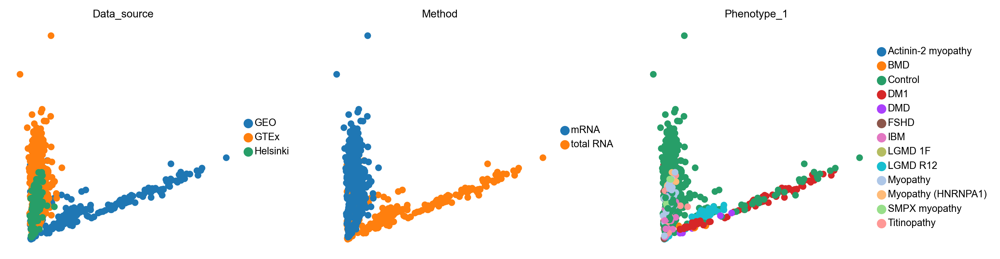

In [44]:
# raw_count

sc.set_figure_params(dpi=150, figsize=[3,3],  fontsize=8,  color_map= 'Set1',transparent=True, frameon=False)

adata_adj.X = adata_adj.layers['raw_count']

sc.pp.pca(adata_adj)
sc.pl.pca(adata_adj, color= ['Data_source',  'Method', 'Phenotype_1'])

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


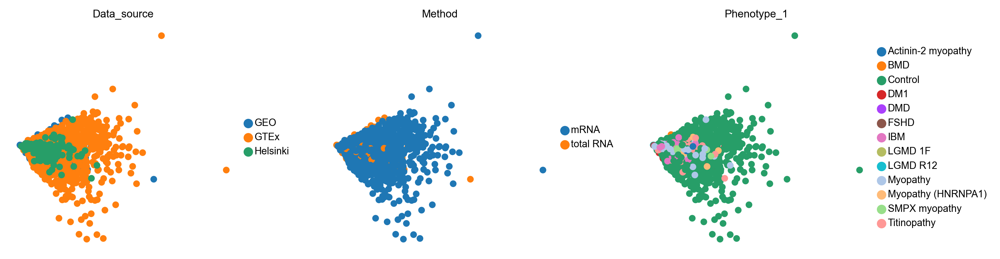

In [106]:
# combatseq_tmm

sc.set_figure_params(dpi=150, figsize=[3,3],  fontsize=8,  color_map= 'Set1',transparent=True, frameon=False)

adata_adj.X = adata_adj.layers['combatseq_tmm']

sc.pp.pca(adata_adj)
sc.pl.pca(adata_adj, color= ['Data_source',  'Method', 'Phenotype_1'])

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


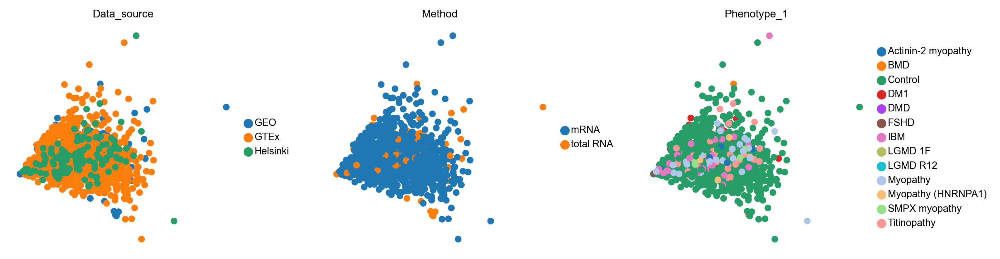

In [92]:
# edgeR

sc.set_figure_params(dpi=150, figsize=[3,3],  fontsize=8,  color_map= 'Set1',transparent=True, frameon=False)

adata_adj.X = adata_adj.layers['edgeR']

sc.pp.pca(adata_adj)
sc.pl.pca(adata_adj, color= ['Data_source',  'Method', 'Phenotype_1'])

In [52]:
adata_adj.X = adata_adj.layers["edgeR"]

# Umap

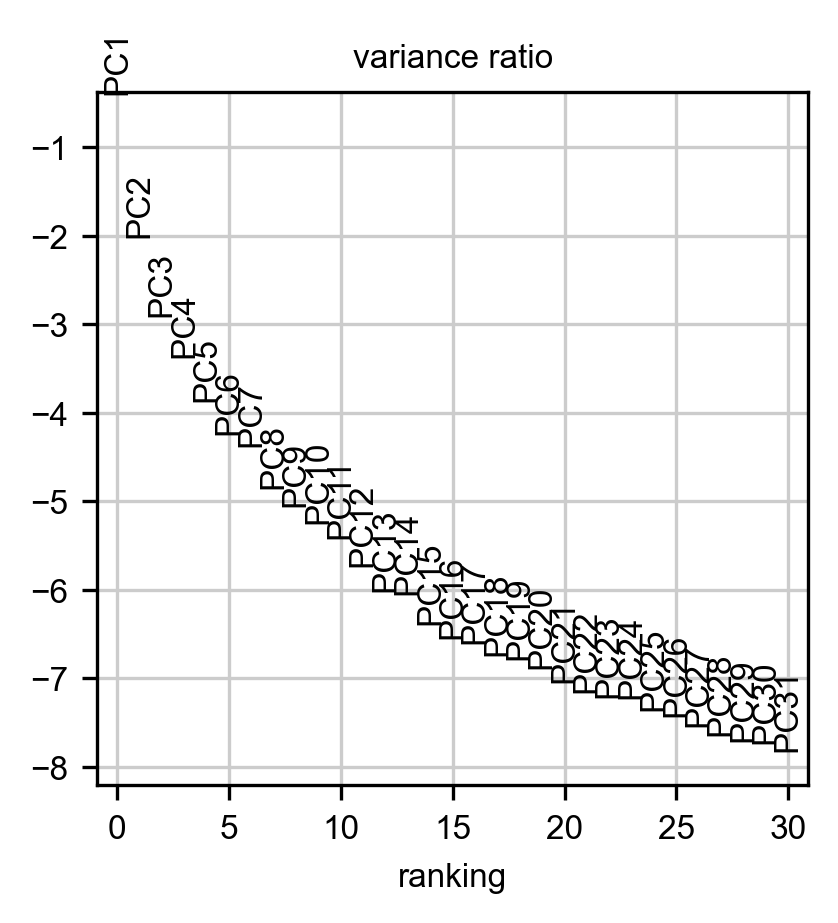

In [47]:
sc.pl.pca_variance_ratio(adata_adj, log=True)

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


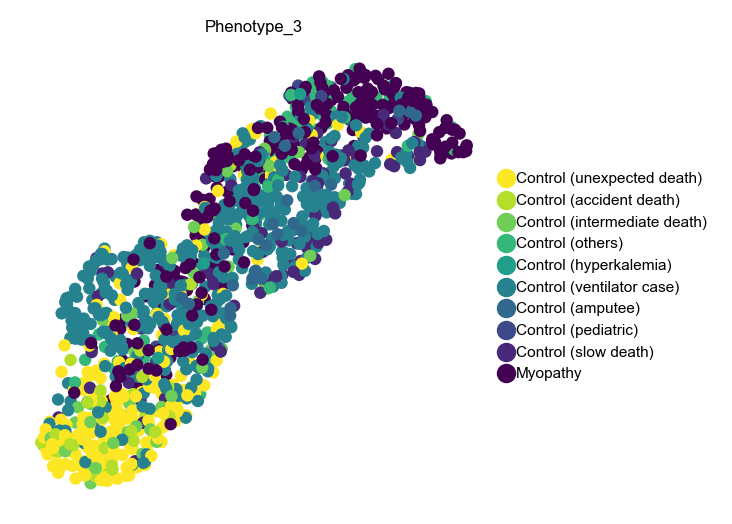

In [149]:
sc.set_figure_params(dpi=100, figsize=[3,3],  dpi_save = 300, fontsize=6,   transparent=True, frameon=False)

sc.pp.neighbors(adata_adj, n_neighbors=20, n_pcs=50)  #n_neighbors=20, n_pcs=50  n_neighbors=30, n_pcs=50
sc.tl.umap(adata_adj)
sc.pl.umap(adata_adj, color=['Phenotype_3'], size=80, ncols = 2, palette = 'viridis_r',)

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


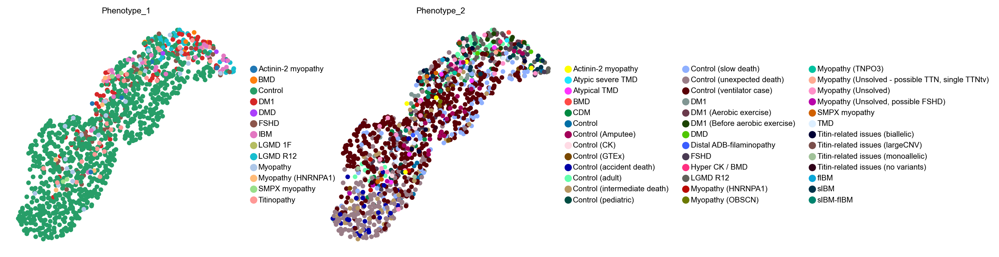

In [61]:
sc.set_figure_params(dpi=100, figsize=[4,4],  dpi_save = 300, fontsize=8,   transparent=True, frameon=False)

sc.pl.umap(adata_adj, color=[ 'Phenotype_1', 'Phenotype_2'], size=80, ncols = 2)

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


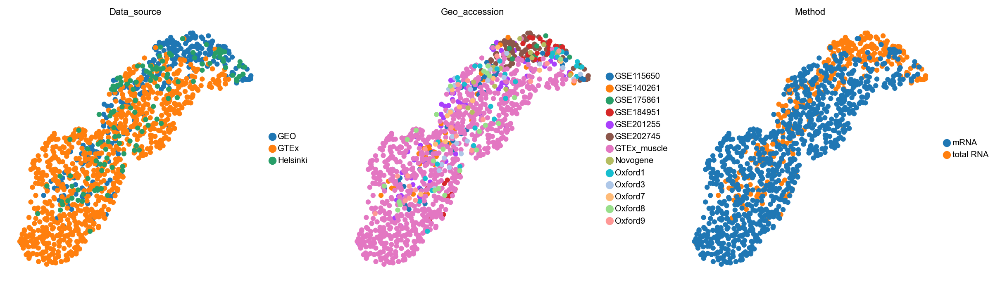

In [66]:
sc.set_figure_params(dpi=100, figsize=[4,4],  dpi_save = 300, fontsize=8,   transparent=True, frameon=False)

sc.pl.umap(adata_adj, color=['Data_source', 'Geo_accession', 'Method'], size=80, ncols = 3)

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


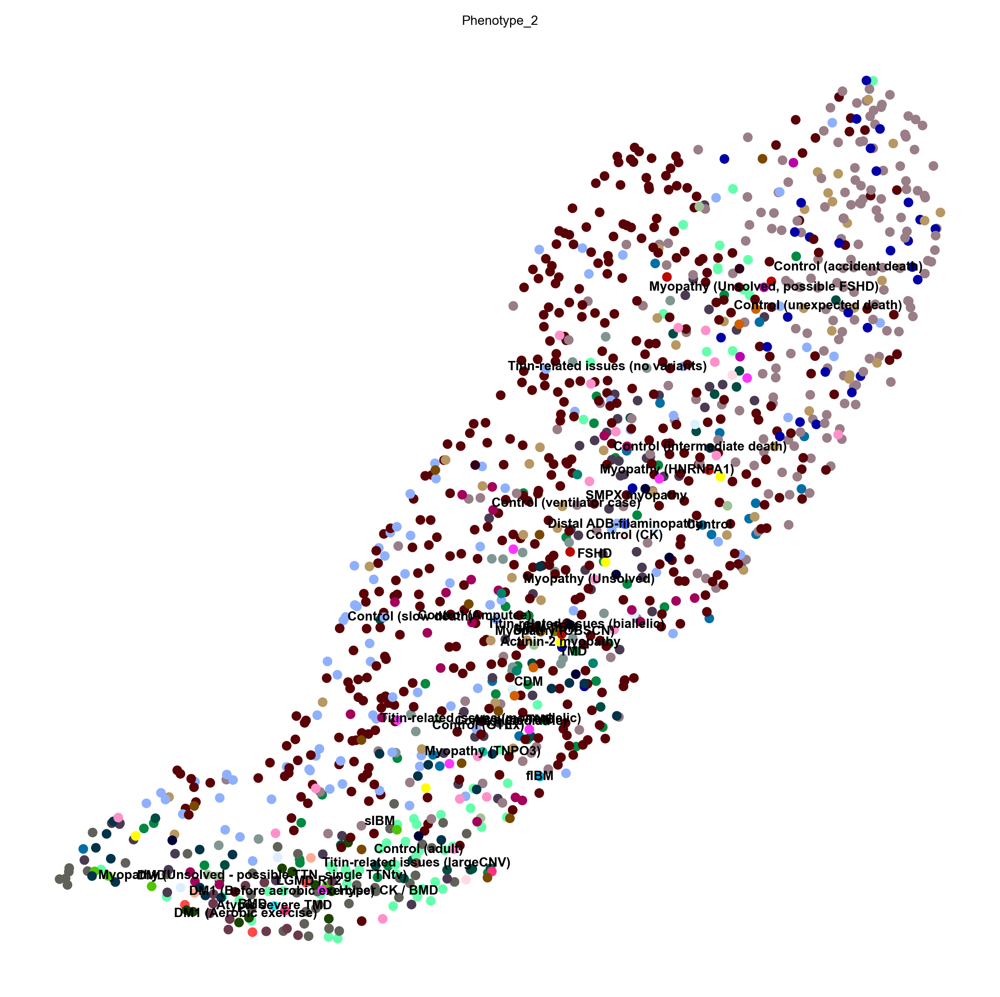

In [130]:
sc.set_figure_params(dpi=200, figsize=[8,8],  dpi_save = 300, fontsize=6,  color_map= 'viridis_r', transparent=True, frameon=False)

sc.pl.umap(adata_adj, color=[ 'Phenotype_2'], size=80, ncols = 2, legend_loc = 'on data')

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
meta NOT subset; don't know how to subset; dropped


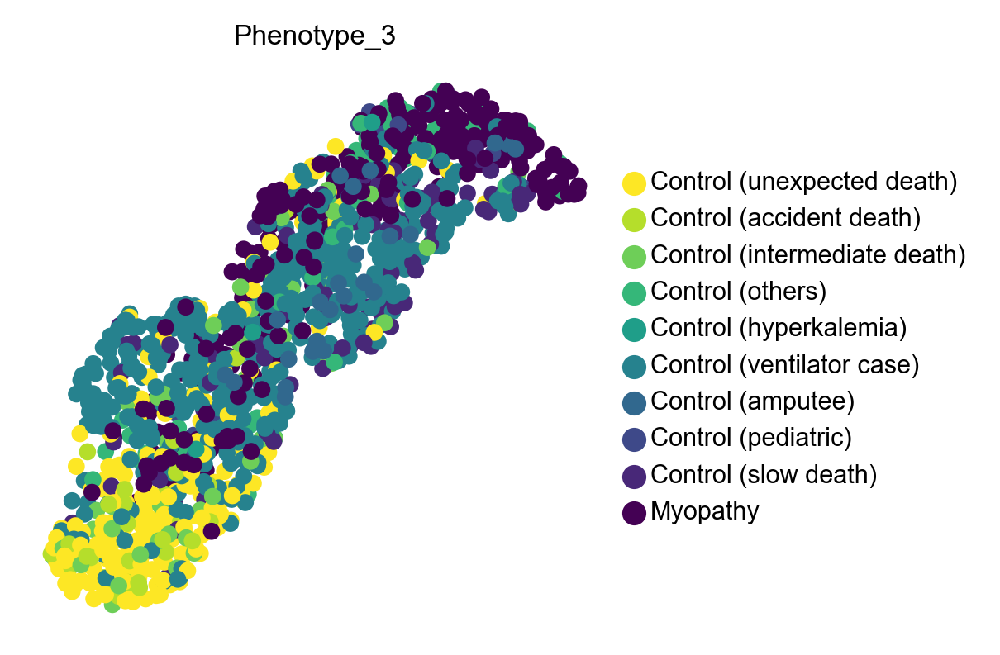

In [68]:
sc.set_figure_params(dpi=150, figsize=[3,3],  dpi_save = 300, fontsize=8,  color_map= 'viridis_r', transparent=True, frameon=False)

sc.pl.umap(adata_adj, color = ['Phenotype_3'], palette = 'viridis_r', save='Gradual change.pdf') #

## Inferring from GTEx controls

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
meta NOT subset; don't know how to subset; dropped


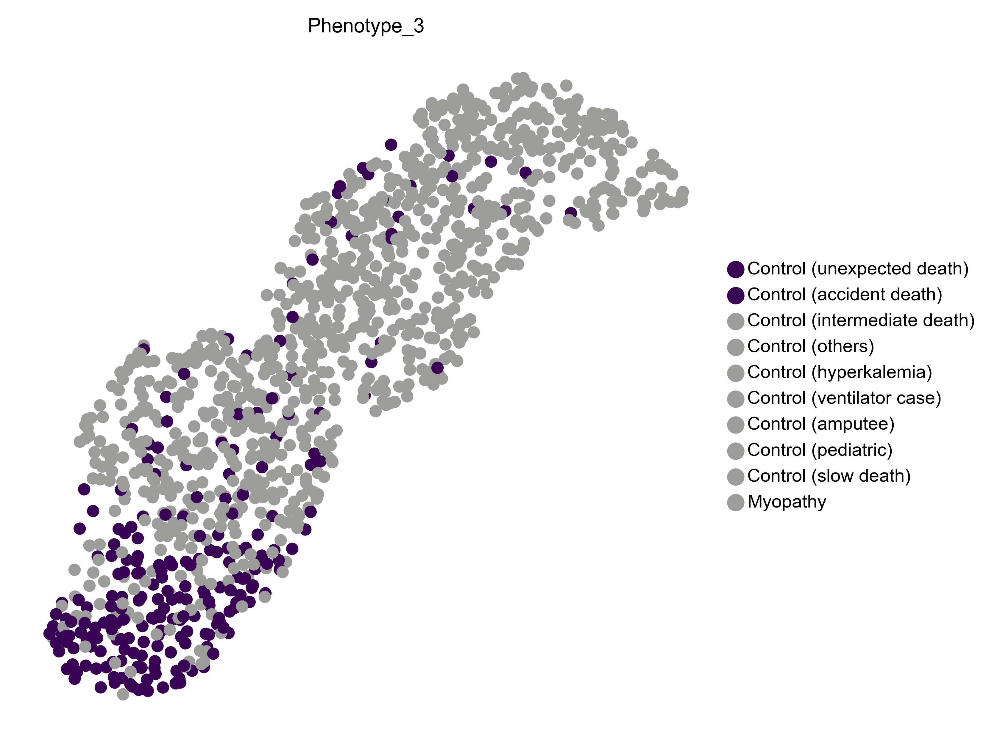

In [69]:
sc.set_figure_params(dpi=300, dpi_save = 300,figsize=[5,5],  fontsize=8,  color_map= 'viridis_r',transparent=True, frameon=False)

sc.pl.umap(adata_adj, color = 'Phenotype_3', palette ={
        "Control (unexpected death)": "#390153",
        "Control (accident death)": "#390153",
        "Control (intermediate death)": '#9c9c9b',
        "Control (ventilator case)": "#9c9c9b",
        "Control (slow death)": "#9c9c9b",
        "Control (amputee)": "#9c9c9b",
        "Control (hyperkalemia)": "#9c9c9b",
        "Control (pediatric)": "#9c9c9b",
        "Control (others)": "#9c9c9b",
        "Myopathy": "#9c9c9b",
    }, legend_loc = 'right margin', save='1_accendentdeath.pdf')

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
meta NOT subset; don't know how to subset; dropped


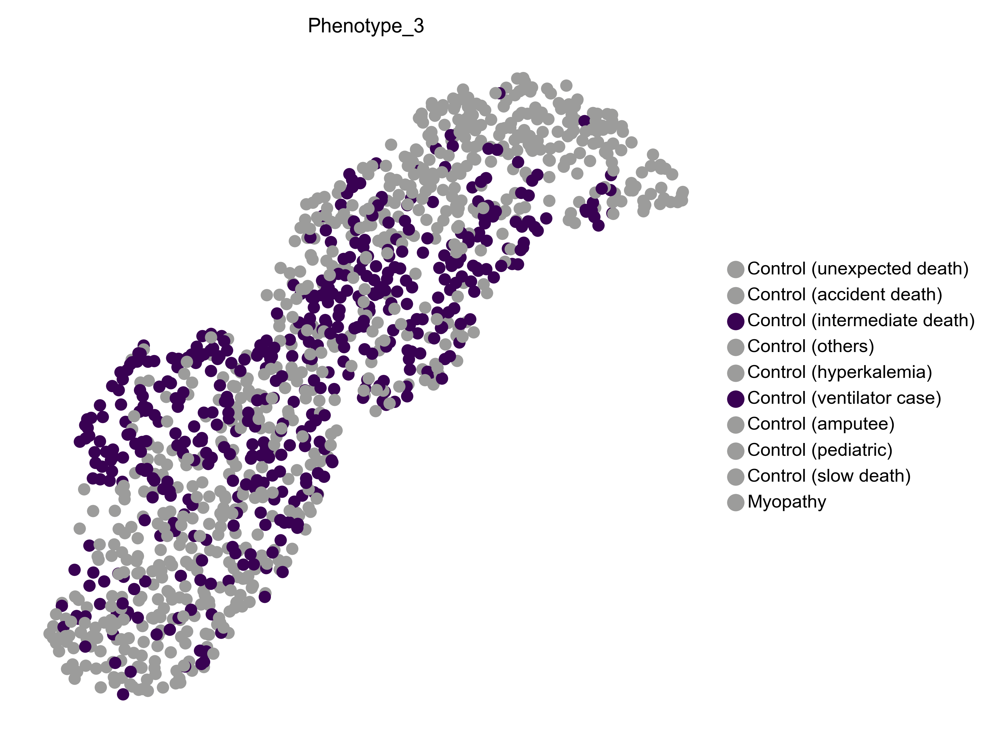

In [70]:
sc.set_figure_params(dpi=300, dpi_save = 300,figsize=[5,5],  fontsize=8,  color_map= 'viridis_r',transparent=True, frameon=False)

sc.pl.umap(adata_adj, color = 'Phenotype_3', palette ={
        "Control (unexpected death)": "#9c9c9b",
        "Control (accident death)": "#9c9c9b",
        "Control (intermediate death)": '#390153',
        "Control (ventilator case)": "#390153",
        "Control (slow death)": "#9c9c9b",
        "Control (amputee)": "#9c9c9b",
        "Control (hyperkalemia)": "#9c9c9b",
        "Control (pediatric)": "#9c9c9b",
        "Control (others)": "#9c9c9b",
        "Myopathy": "#9c9c9b",
    }, legend_loc = 'right margin', save='2_intermediatedeath.pdf')

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
meta NOT subset; don't know how to subset; dropped


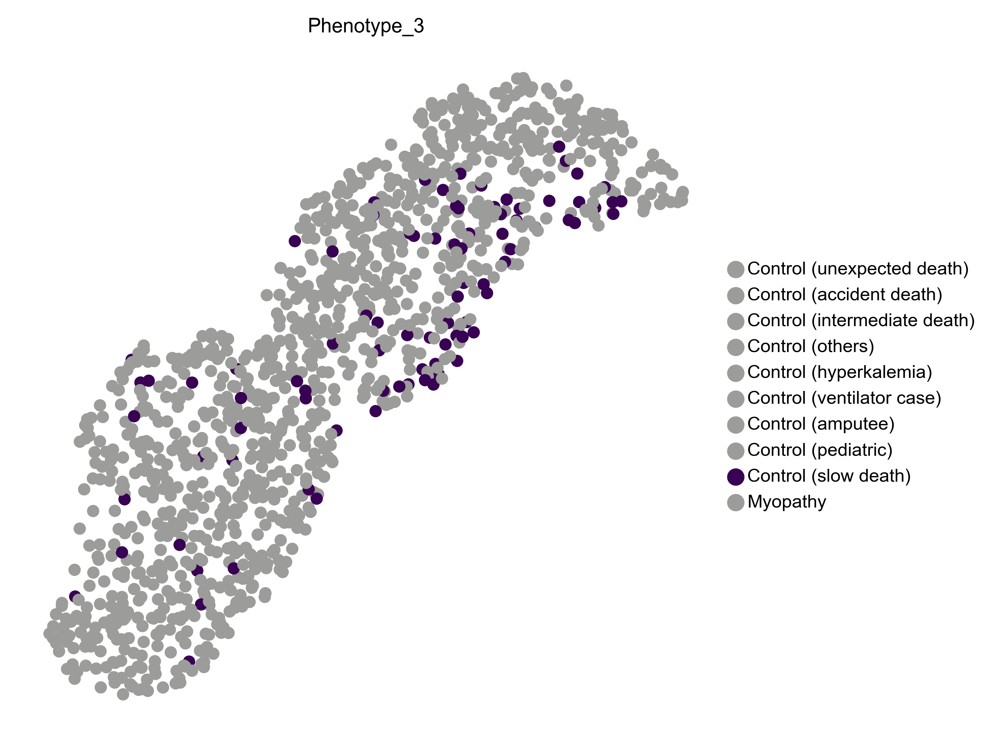

In [71]:
sc.set_figure_params(dpi=300, dpi_save = 300,figsize=[5,5],  fontsize=8,  color_map= 'viridis_r',transparent=True, frameon=False)

sc.pl.umap(adata_adj, color = 'Phenotype_3', palette ={
        "Control (unexpected death)": "#9c9c9b",
        "Control (accident death)": "#9c9c9b",
        "Control (intermediate death)": '#9c9c9b',
        "Control (ventilator case)": "#9c9c9b",
        "Control (slow death)": "#390153",
        "Control (amputee)": "#9c9c9b",
        "Control (hyperkalemia)": "#9c9c9b",
        "Control (pediatric)": "#9c9c9b",
        "Control (others)": "#9c9c9b",
        "Myopathy": "#9c9c9b",
    }, legend_loc = 'right margin', save='3_slowdeath.pdf')

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
meta NOT subset; don't know how to subset; dropped


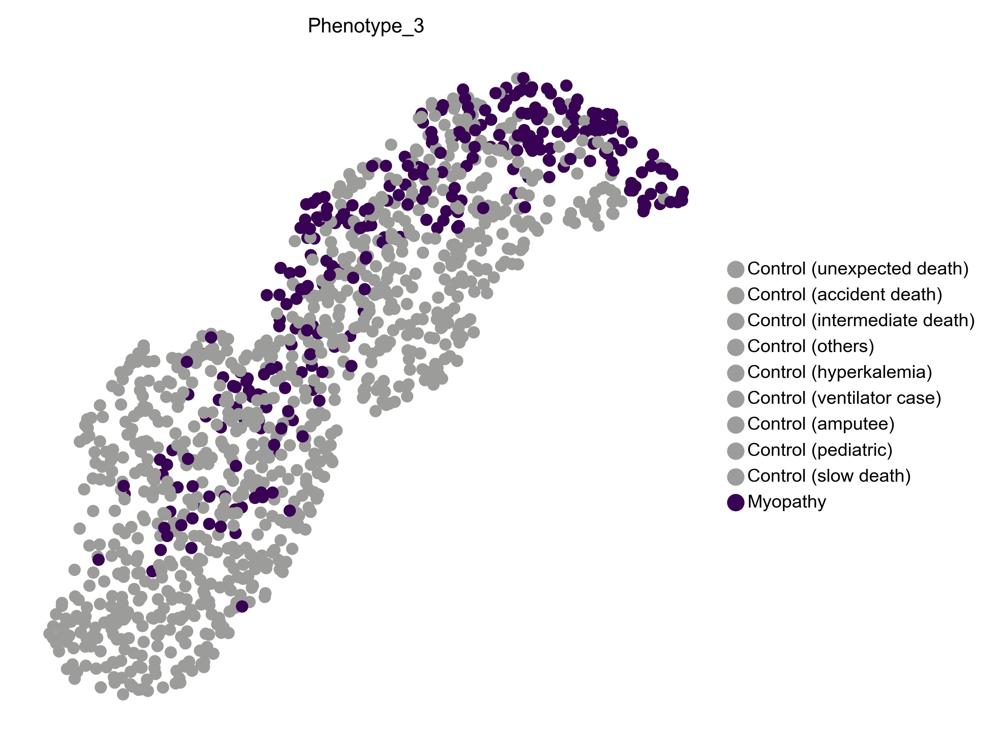

In [72]:
sc.set_figure_params(dpi=300, dpi_save = 300,figsize=[5,5],  fontsize=8,  color_map= 'viridis_r',transparent=True, frameon=False)

sc.pl.umap(adata_adj, color = 'Phenotype_3', palette ={
        "Control (unexpected death)": "#9c9c9b",
        "Control (accident death)": "#9c9c9b",
        "Control (intermediate death)": '#9c9c9b',
        "Control (ventilator case)": "#9c9c9b",
        "Control (slow death)": "#9c9c9b",
        "Control (amputee)": "#9c9c9b",
        "Control (hyperkalemia)": "#9c9c9b",
        "Control (pediatric)": "#9c9c9b",
        "Control (others)": "#9c9c9b",
        "Myopathy": "#390153", ##
    }, legend_loc = 'right margin', save='4_myopathy.pdf')

# Myopathy spectrum validation

# Trajectory

In [ ]:
category_order_list = ['Control (unexpected death)', 'Control (accident death)', 'Control (intermediate death)', 'Control (ventilator case)', 'Control (slow death)', 'Control (amputee)', 'Control (hyperkalemia)', 'Control (pediatric)', 'Control (others)', 'Myopathy']

adata_adj.obs['Phenotype_3'] = adata_adj.obs['Phenotype_3'].astype('category').cat.set_categories(category_order_list, ordered=True)


c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


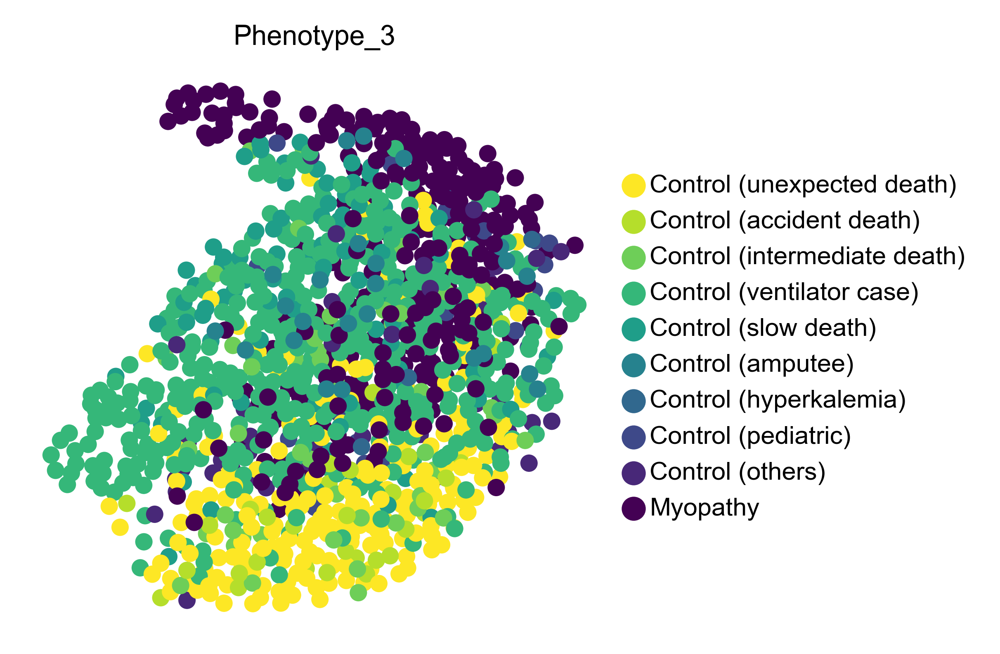

In [122]:
sc.tl.draw_graph(adata_adj)
sc.pl.draw_graph(adata_adj, color='Phenotype_3', palette= 'viridis_r') #, legend_loc='on data'``

In [123]:
sc.tl.diffmap(adata_adj)
sc.pp.neighbors(adata_adj, n_neighbors=10, use_rep='X_diffmap')

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


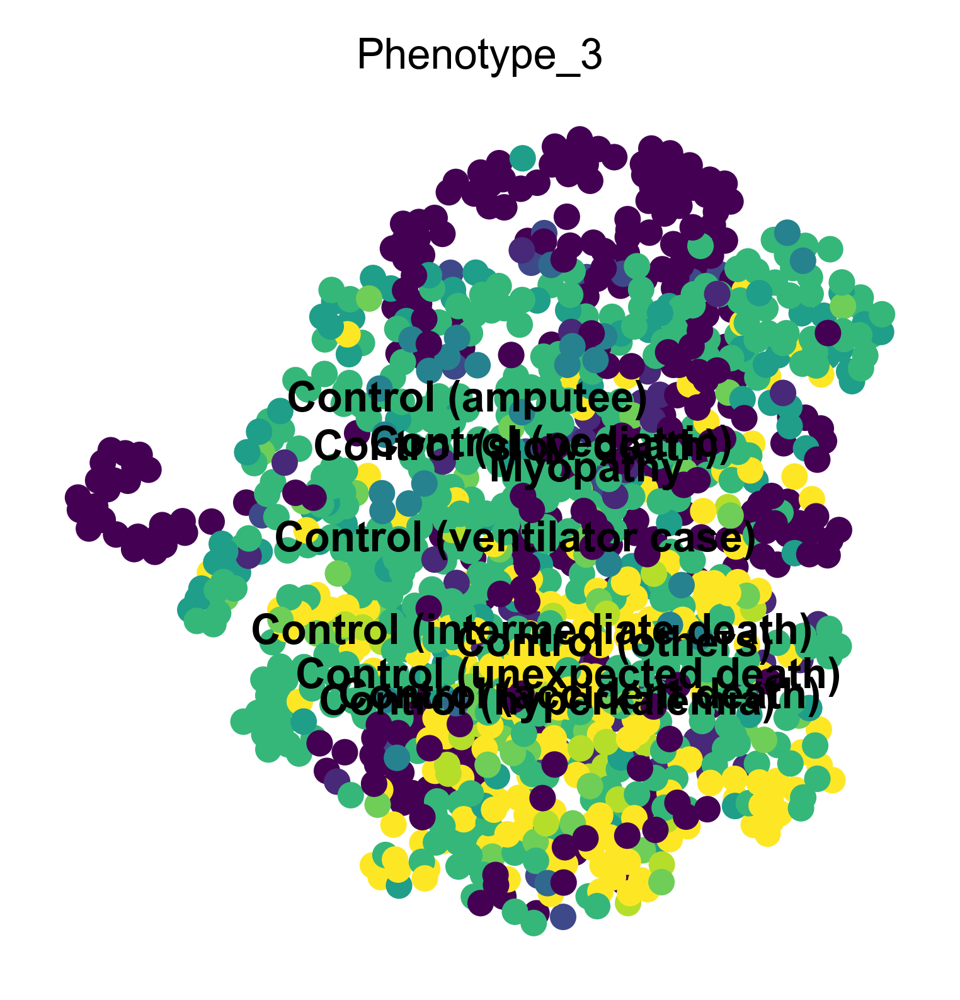

In [125]:
sc.tl.draw_graph(adata_adj)
sc.pl.draw_graph(adata_adj, color='Phenotype_3', legend_loc='on data')

ValueError: Expected `colors` to be of length `2`, found `4`.

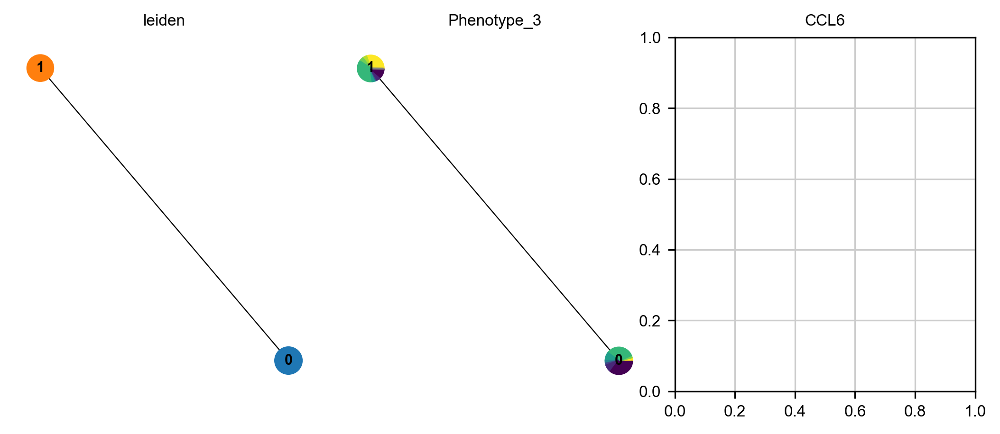

In [25]:
sc.tl.leiden(adata_adj, resolution=0.2)
sc.tl.paga(adata_adj)
sc.pl.paga(adata_adj, color=['leiden', 'Phenotype_3', 'CCL6'])

# Myopathy common pathways

In [35]:
import gseapy as gp

#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
gene_set_names = gp.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Perturbations_from_GEO_down', 'Disease

In [48]:
EdgeR_result = pd.read_csv("DEG/EdgeR IBM vs. fast [combat].csv", index_col=False)
EdgeR_result

,genes,logFC,logCPM,PValue,FDR
0,ACLY,1.377005,5.070708,2.474927e-31,2.234119e-27
1,ADH1B,2.342359,6.617169,4.840471e-31,2.234119e-27
2,PRKCD,1.858004,3.281988,1.942914e-28,5.978348e-25
3,STAT5A,1.069798,5.358123,9.655634e-24,2.228279e-20
4,FADS1,1.854035,4.788555,6.188628e-23,1.142544e-19
...,...,...,...,...,...
9226,GCLM,-0.001780,5.269898,9.992373e-01,9.996705e-01
9227,COLEC12,-0.006832,3.538234,9.999620e-01,1.000000e+00
9228,ZNF573,-0.018715,1.042090,1.000000e+00,1.000000e+00
9229,CCDC36,-0.013495,0.988268,1.000000e+00,1.000000e+00


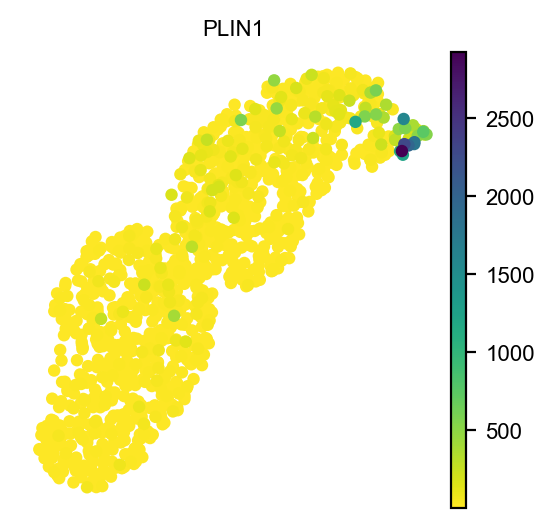

In [209]:
sc.set_figure_params(dpi=100, dpi_save = 300,figsize=[3,3],  fontsize=8,  color_map= 'viridis_r',transparent=True, frameon=False)

sc.pl.umap(adata_adj, color=['PLIN1'], size=80, ncols = 2, layer='edgeR')

In [49]:
# MC gene seta
Set_genes_up = EdgeR_result[(EdgeR_result.FDR < 0.05) & (EdgeR_result.logFC > 1.5)].sort_values(by=['logFC'], ascending=False).reset_index(drop=True)
Set_genes_down = EdgeR_result[(EdgeR_result.FDR < 0.05) & (EdgeR_result.logFC < -1.5)].sort_values(by=['logFC'], ascending=True).reset_index(drop=True)
Set_genes_both = EdgeR_result[(EdgeR_result.FDR < 0.05) & (abs(EdgeR_result.logFC) > 1.5)].sort_values(by=['logFC'], ascending=False).reset_index(drop=True)


glist_up = Set_genes_up['genes'].squeeze().str.strip().tolist()
glist_down = Set_genes_down['genes'].squeeze().str.strip().tolist()
glist_both = Set_genes_both['genes'].squeeze().str.strip().tolist()

print(f'All: {len(glist_both)}, Up: {len(glist_up)}, Down: {len(glist_down)}')

All: 18, Up: 16, Down: 2


In [50]:
Set_genes_both

,genes,logFC,logCPM,PValue,FDR
0,ADH1B,2.342359,6.617169,4.840471e-31,2.234119e-27
1,FASN,2.224420,6.888723,1.095350e-18,4.212989e-16
2,MGST1,2.117672,3.629765,1.599582e-14,1.757826e-12
3,CD163,1.957961,4.480615,2.611323e-20,1.854240e-17
4,CPM,1.938113,3.992756,9.007916e-23,1.187887e-19
5,AOX1,1.868480,4.720947,3.637495e-20,2.358921e-17
6,FABP4,1.867462,6.183456,1.308365e-15,2.047036e-13
7,PYGL,1.867318,3.244857,7.828297e-20,4.516438e-17
8,PRKCD,1.858004,3.281988,1.942914e-28,5.978348e-25
9,FADS1,1.854035,4.788555,6.188628e-23,1.142544e-19


<AxesSubplot: title={'center': 'GO_Molecular_Function_2021'}, xlabel='Combined Score'>

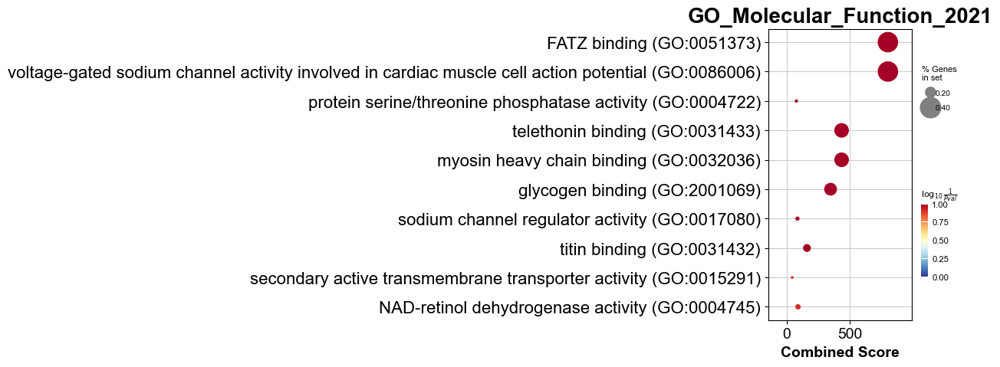

In [270]:
# GO_Biological_Process_2021, GO_Cellular_Component_2021, GO_Molecular_Function_2021, Human_Phenotype_Ontology, CellMarker_Augmented_2021, KEGG_2021_Human, Reactome_2022, WikiPathway_2021_Human

sc.set_figure_params(dpi=50, dpi_save = 300,figsize=[3,3],  fontsize=8,  color_map= 'viridis_r',transparent=True, frameon=False)

gene_sets_defined = 'GO_Molecular_Function_2021'
gene_list_defined = glist_both


enr_res = gp.enrichr(gene_list=gene_list_defined,
                     organism='Human',
                     gene_sets= gene_sets_defined,
                     background = EdgeR_result.genes,
                     #description='pathway',
                     cutoff = 1) #0.5 as default

enr_res.results.head()

gp.dotplot(enr_res.res2d, title=gene_sets_defined ,cmap='RdYlBu_r', size=8, figsize=(3,5), cutoff = 1) #cmap='viridis_r', cutoff = 0.8

#plt.savefig('glist_up 1.pdf')

In [89]:
#sc.pp.log1p(adata_adj)
adata_adj.layers['scaled'] = sc.pp.scale(adata_adj, copy=True).X

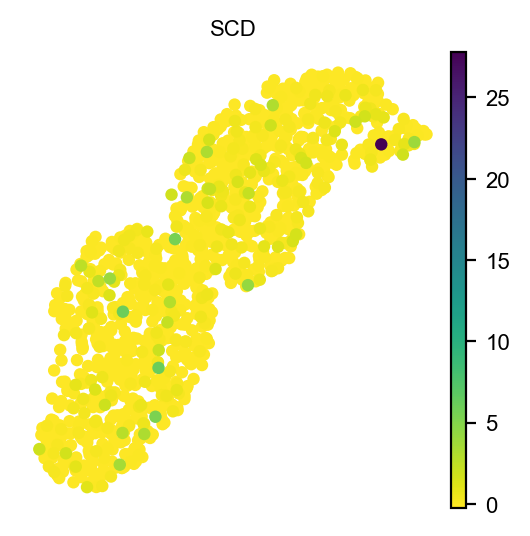

In [91]:
sc.set_figure_params(dpi=100, dpi_save = 300,figsize=[3,3],  fontsize=8,  color_map= 'viridis_r',transparent=True, frameon=False)

sc.pl.umap(adata_adj, color=['SCD'], size=80, ncols = 2, layer='scaled')

In [104]:
sc.get.rank_genes_groups_df(adata_adj, group='Control (unexpected death)')

,names,scores,logfoldchanges,pvals,pvals_adj
0,GLOD4,17.441065,1.492246,4.025069e-68,3.715541e-64
1,ECHDC2,17.390594,1.751330,9.722146e-68,4.487257e-64
2,OSGEP,17.260265,1.549191,9.367980e-67,2.468773e-63
3,GSTA4,17.252598,1.675390,1.069775e-66,2.468773e-63
4,ME3,17.223211,1.568966,1.778424e-66,3.228741e-63
...,...,...,...,...,...
9226,FASN,-1.528808,-0.138186,1.263120e-01,1.266000e-01
9227,MGST1,-2.209840,-0.383976,2.711624e-02,2.720466e-02
9228,CD163,-2.274366,-0.204839,2.294400e-02,2.303132e-02
9229,CDKN1A,-2.400223,-0.481807,1.638510e-02,1.645283e-02


In [107]:
# No use
Set_genes = sc.get.rank_genes_groups_df(adata_adj, group='Control (unexpected death)')
Set_genes_up = Set_genes[(Set_genes.pvals_adj < 0.05) & (Set_genes.logfoldchanges > 2)].sort_values(by=['logfoldchanges'], ascending=False).reset_index(drop=True)
#Set_genes_down = Set_genes[(Set_genes.pvals_adj < 0.05) & (Set_genes.logfoldchanges < -2)].sort_values(by=['pvals'], ascending=False).reset_index(drop=True)[0:500]
#Set_genes_down = Set_genes[(Set_genes.logfoldchanges < 0)].sort_values(by=['pvals'], ascending=False).reset_index(drop=True)[0:500]
#Set_genes_up = Set_genes.sort_values(by=['pvals'], ascending=False).reset_index(drop=True)[0:500]
Set_genes_down = Set_genes[(Set_genes.pvals_adj < 0.05) & (Set_genes.logfoldchanges < -2)].sort_values(by=['logfoldchanges'], ascending=True).reset_index(drop=True)

glist_up = Set_genes_up['names'].squeeze().str.strip().tolist()
glist_down = Set_genes_down['names'].squeeze().str.strip().tolist()

print(f'Up: {len(glist_up)}, Down: {len(glist_down)}')

Up: 112, Down: 0


# Phenotype feature genes

In [27]:
adata_adj = sc.read('./write/adata_all_muscle_combat_tmm_nounhealthycontrols.h5ad')
adata_adj

AnnData object with n_obs × n_vars = 1177 × 16953
    obs: 'Data_source', 'Geo_accession', 'Author_Date', 'Gsm_accession', 'Casual_gene', 'Phenotype_1', 'Phenotype_2', 'Tissue', 'Method', 'Platform', 'Phenotype_3', 'Phenotype_4'
    uns: 'Data_source_colors', 'Geo_accession_colors', 'Method_colors', 'Phenotype_1_colors', 'Phenotype_2_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [41]:
# Could not calculate statistics for groups LGMD 1F since they only contain one sample.

adata_feature = adata_adj[~adata_adj.obs.Phenotype_4.isin(['Myopathy (TNPO3)', 'Distal ADB-filaminopathy', 'Myopathy (OBSCN)', 'Myopathy (Unsolved)'])]
adata_feature

View of AnnData object with n_obs × n_vars = 1150 × 9231
    obs: 'Data_source', 'Geo_accession', 'Author_Date', 'Gsm_accession', 'Casual_gene', 'Phenotype_1', 'Phenotype_2', 'Tissue', 'Method', 'Platform', 'Phenotype_3', 'Phenotype_4', 'leiden'
    uns: 'pca', 'Data_source_colors', 'Method_colors', 'Phenotype_1_colors', 'neighbors', 'umap', 'Geo_accession_colors', 'Phenotype_2_colors', 'Phenotype_3_colors', 'draw_graph', 'leiden', 'paga', 'leiden_sizes', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fr'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [32]:
pd.DataFrame(adata_feature.obs.groupby('Phenotype_4').count()['Data_source'])

,Data_source
Phenotype_4,
Actinin-2 myopathy,5
BMD,5
CDM,36
Control (amputee),24
Control (fast death),234
Control (hyperkalemia),3
Control (intermediate death),470
Control (others),67
Control (slow death),87


In [279]:
category_order_list = [
 'Control (fast death)',
 'Control (intermediate death)',
 'Control (slow death)',
 'Control (others)',
 'Control (amputee)',
 'Control (hyperkalemia)',
 'CDM',
 'DM1',
 'FSHD',
 'IBM',
 'LGMD R12',
 'Titinopathy',
 'DMD',
 'BMD',
 'Actinin-2 myopathy',
 'Myopathy (OBSCN)',
 'Myopathy (Unsolved)',
 'Myopathy (TNPO3)',
 'Myopathy (HNRNPA1)',
 'Distal ADB-filaminopathy',
 'SMPX myopathy'
 ]

adata_adj.obs['Phenotype_4'] = adata_adj.obs['Phenotype_4'].astype('category').cat.set_categories(category_order_list, ordered=True)

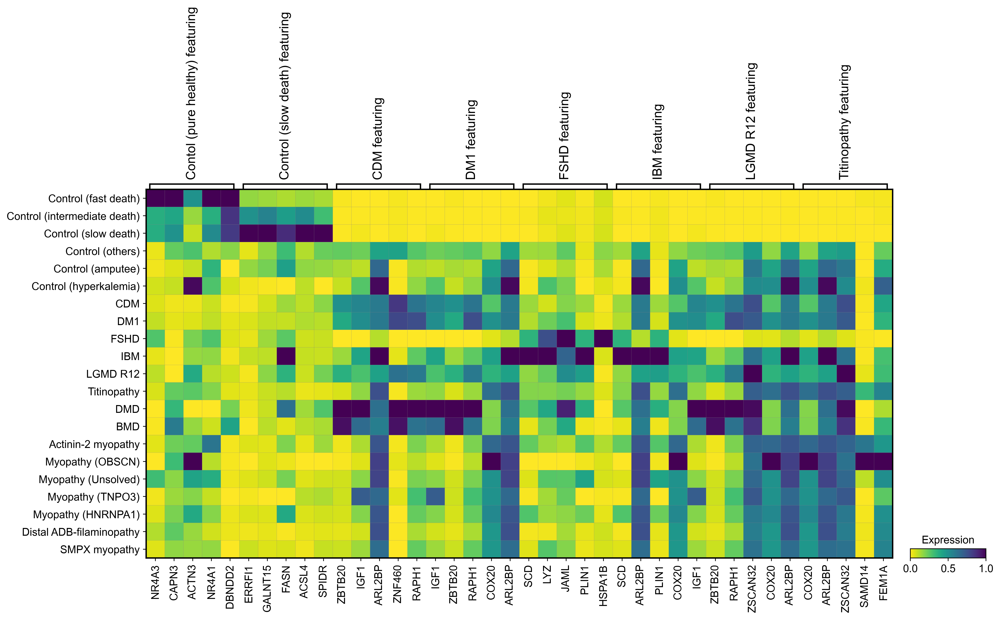

In [282]:
sc.set_figure_params(dpi=200, dpi_save = 300, figsize=[5,5],  fontsize=14,  color_map= 'viridis_r',transparent=True, frameon=False)

marker_genes_dict = {
    'Contol (pure healthy) featuring': ['NR4A3', 'CAPN3', 'ACTN3', 'NR4A1', 'DBNDD2'],
    'Control (slow death) featuring': ['ERRFI1', 'GALNT15', 'FASN', 'ACSL4', 'SPIDR'],
    'CDM featuring': ['ZBTB20', 'IGF1', 'ARL2BP', 'ZNF460', 'RAPH1'],
    'DM1 featuring': ['IGF1', 'ZBTB20', 'RAPH1', 'COX20', 'ARL2BP'],
    'FSHD featuring': ['SCD', 'LYZ', 'JAML', 'PLIN1', 'HSPA1B'],
    'IBM featuring': ['SCD', 'ARL2BP', 'PLIN1', 'COX20', 'IGF1'],
    'LGMD R12 featuring': ['ZBTB20', 'RAPH1', 'ZSCAN32', 'COX20', 'ARL2BP'],
    'Titinopathy featuring': ['COX20', 'ARL2BP', 'ZSCAN32', 'SAMD14', 'FEM1A'],
}


sc.pl.matrixplot(adata_adj, marker_genes_dict, 'Phenotype_4', dendrogram=False,
                 colorbar_title='Expression', layer='edgeR', standard_scale='var', cmap='viridis_r')

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


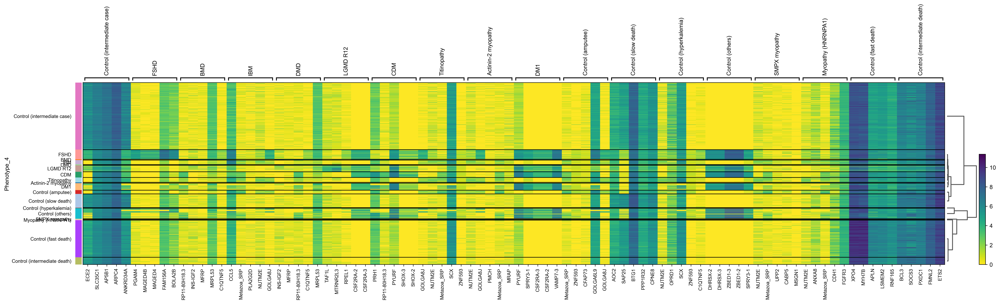

In [33]:
sc.set_figure_params(dpi=200, dpi_save = 300, figsize=[5,2],  fontsize=10,  color_map= 'viridis_r',transparent=True, frameon=False)

sc.pl.rank_genes_groups_heatmap(adata_feature, log= True, n_genes=5, show_gene_labels=True)

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


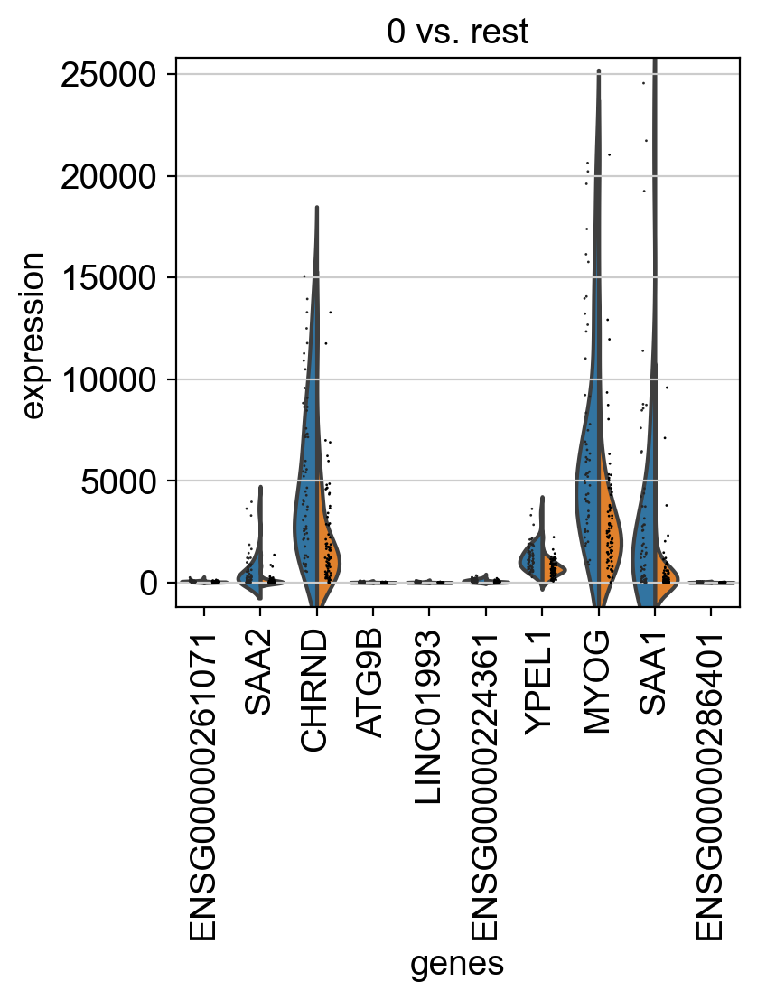

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


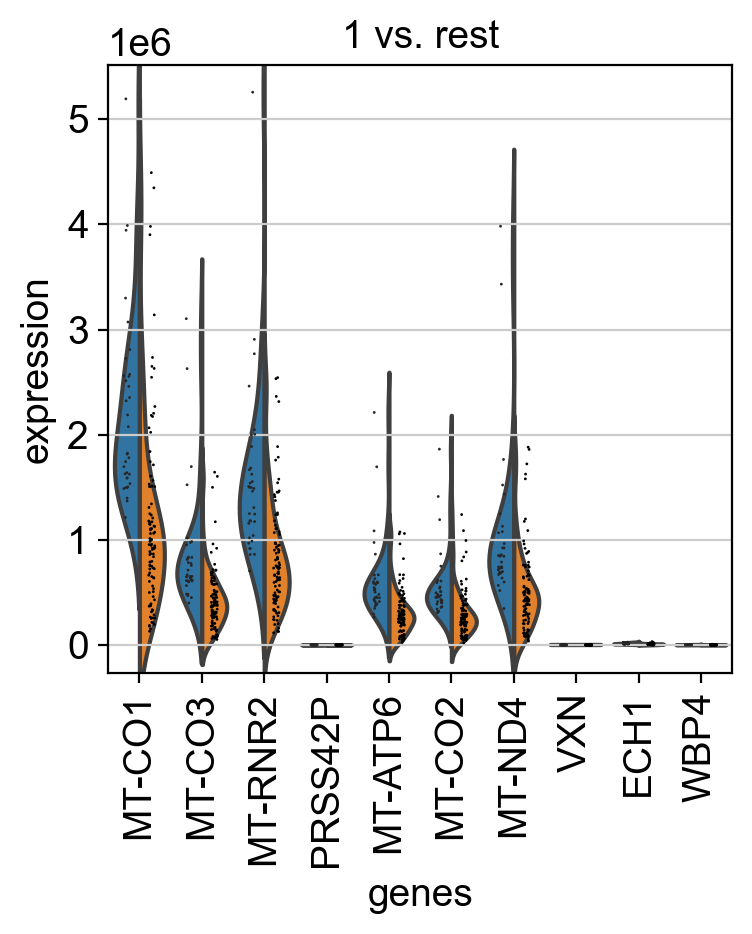

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


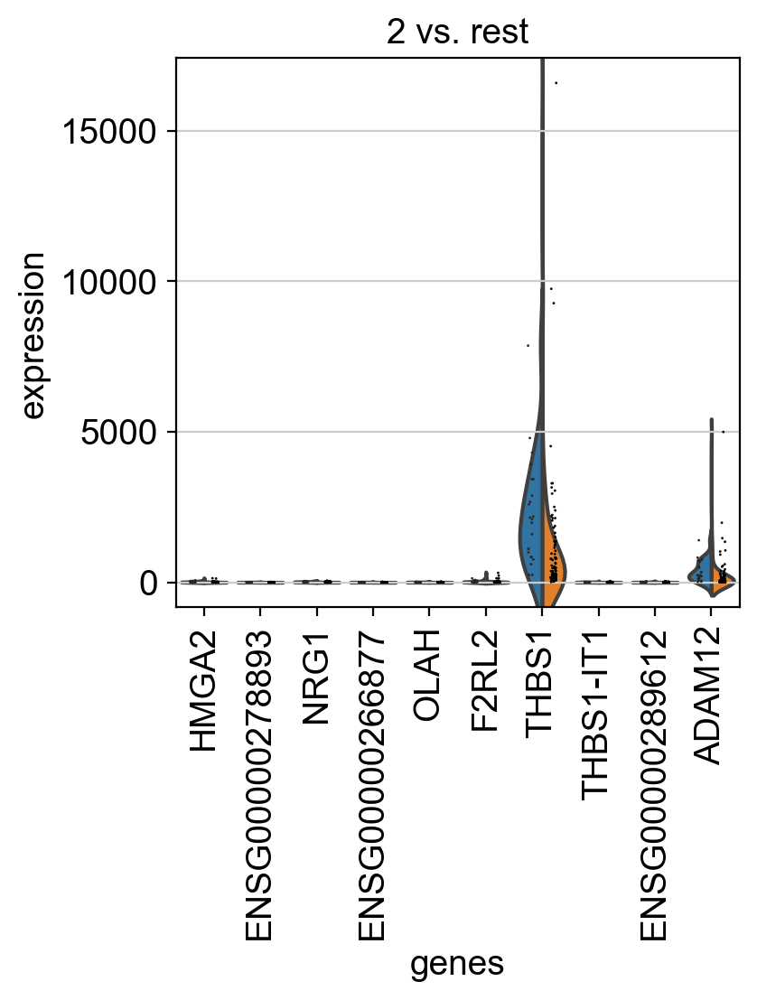

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\seaborn\categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


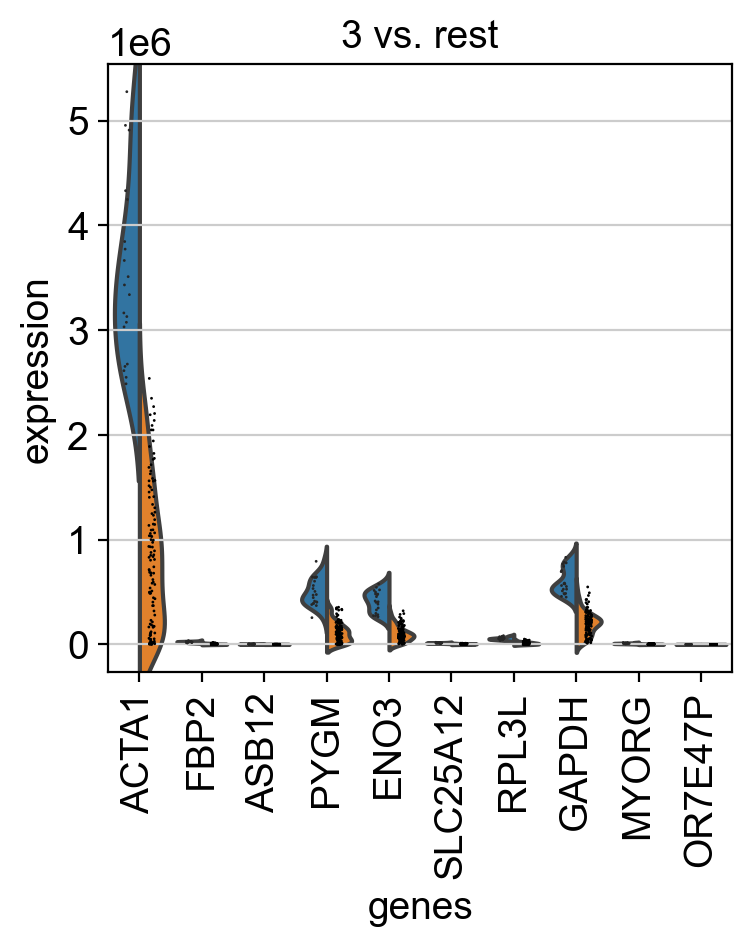

In [50]:
sc.pl.rank_genes_groups_violin(adata_adj, n_genes=10)

# Gene Set Analysis

In [63]:
import gseapy as gp

#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
gene_set_names = gp.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Perturbations_from_GEO_down', 'Disease

In [106]:
# MC gene set
Set_genes = sc.get.rank_genes_groups_df(adata_adj, group='3')
Set_genes_up = Set_genes[(Set_genes.pvals_adj < 0.05) & (Set_genes.logfoldchanges > 2)].sort_values(by=['scores'], ascending=False).reset_index(drop=True)
Set_genes_down = Set_genes[(Set_genes.pvals_adj < 0.05) & (Set_genes.logfoldchanges < -2)].sort_values(by=['scores'], ascending=False).reset_index(drop=True)

glist_up = Set_genes_up['names'].squeeze().str.strip().tolist()
glist_down = Set_genes_down['names'].squeeze().str.strip().tolist()

print(f'Up: {len(glist_up)}, Down: {len(glist_down)}')

Up: 5427, Down: 1422


In [99]:
Set_genes_up.sort_values(by=['pvals_adj']).head(30)

,names,scores,logfoldchanges,pvals,pvals_adj
0,PRSS42P,6.079476,inf,1.205761e-09,0.000019
1,VXN,5.849386,11.292477,4.933900e-09,0.000037
2,ENSG00000286215,5.695993,322.419891,1.226557e-08,0.000069
3,MTCO3P12,5.680654,192.315552,1.341807e-08,0.000069
4,ENSG00000286833,5.639749,8.856208,1.702980e-08,0.000075
5,SAMD14,5.542600,205.063141,2.980126e-08,0.000101
6,ENSG00000267417,5.537487,67.300888,3.068421e-08,0.000101
7,C6orf163,5.517035,43.205112,3.447671e-08,0.000101
8,ENSG00000289609,5.455678,38.587017,4.878644e-08,0.000137
12,MTRNR2L12,5.409660,370.167114,6.314461e-08,0.000139


## MC Up genes 
- GO_Biological_Process_2021, GO_Cellular_Component_2021, GO_Molecular_Function_2021, Human_Phenotype_Ontology, CellMarker_Augmented_2021, KEGG_2021_Human, Reactome_2022, WikiPathway_2021_Human

<AxesSubplot: title={'center': 'CellMarker_Augmented_2021'}, xlabel='Combined Score'>

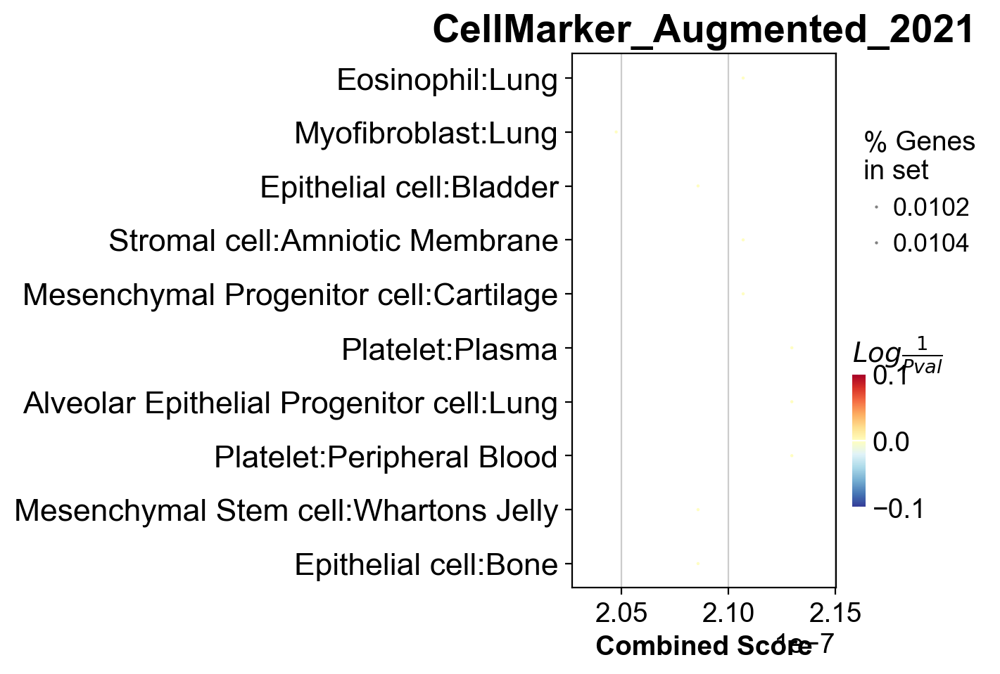

In [149]:
gene_sets_defined = 'CellMarker_Augmented_2021'
gene_list_defined = glist_up


enr_res = gp.enrichr(gene_list=gene_list_defined,
                     organism='Human',
                     gene_sets= gene_sets_defined,
                     #description='pathway',
                     cutoff = 1) #0.5 as default

enr_res.results.head()

gp.dotplot(enr_res.res2d, title=gene_sets_defined ,cmap='RdYlBu_r', size=20, figsize=(3,5), cutoff = 1) #cmap='viridis_r', cutoff = 0.8

#plt.savefig('glist_up 1.pdf')

In [118]:
adata_adj.obs.to_excel('MYH_clustering.xlsx')

In [138]:
adata_adj.write('./write/adata_adj_MYH.h5ad')

# Muscle fiber type

In [2]:
adata_MYH = sc.read('./write/adata_adj_MYH.h5ad')
adata_MYH

AnnData object with n_obs × n_vars = 134 × 61589
    obs: 'Batch', 'leiden'
    uns: 'Batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [130]:
MYH_genes = ['MYH15', 'MYH16', 'MYH6', 'MYH7', 'MYH11', 'MYH10', 'MYH13', 'MYHAS', 'MYH8', 'MYH4', 'MYH1', 'MYH2', 'MYH3', 'MYH14', 'MYH7B', 'MYH9']

adata_MYH = adata_adj[:, adata_adj.var_names.isin(MYH_genes)]
adata_MYH

View of AnnData object with n_obs × n_vars = 134 × 16
    obs: 'Batch', 'leiden'
    uns: 'pca', 'Batch_colors', 'neighbors', 'umap', 'leiden', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## Bar plot

In [7]:
MYH_genes = ['MYH15', 'MYH16', 'MYH6', 'MYH7', 'MYH11', 'MYH10', 'MYH13', 'MYHAS', 'MYH8', 'MYH4', 'MYH1', 'MYH2', 'MYH3', 'MYH14', 'MYH7B', 'MYH9']

df = sc.get.obs_df(adata_MYH, MYH_genes + ['leiden','Batch'], use_raw=False)
df2 = df.melt(id_vars=['leiden','Batch'], value_vars=MYH_genes)

df2

,leiden,Batch,variable,value
0,5,0,MYH15,10.559525
1,2,0,MYH15,11.099918
2,2,0,MYH15,16.144590
3,2,0,MYH15,11.808056
4,1,0,MYH15,43.350582
...,...,...,...,...
2139,0,9,MYH9,9169.932617
2140,0,9,MYH9,10631.240234
2141,2,9,MYH9,6568.561523
2142,5,9,MYH9,17283.197266


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 [Text(0, 0, 'MYH15'),
  Text(1, 0, 'MYH16'),
  Text(2, 0, 'MYH6'),
  Text(3, 0, 'MYH7'),
  Text(4, 0, 'MYH11'),
  Text(5, 0, 'MYH10'),
  Text(6, 0, 'MYH13'),
  Text(7, 0, 'MYHAS'),
  Text(8, 0, 'MYH8'),
  Text(9, 0, 'MYH4'),
  Text(10, 0, 'MYH1'),
  Text(11, 0, 'MYH2'),
  Text(12, 0, 'MYH3'),
  Text(13, 0, 'MYH14'),
  Text(14, 0, 'MYH7B'),
  Text(15, 0, 'MYH9')])

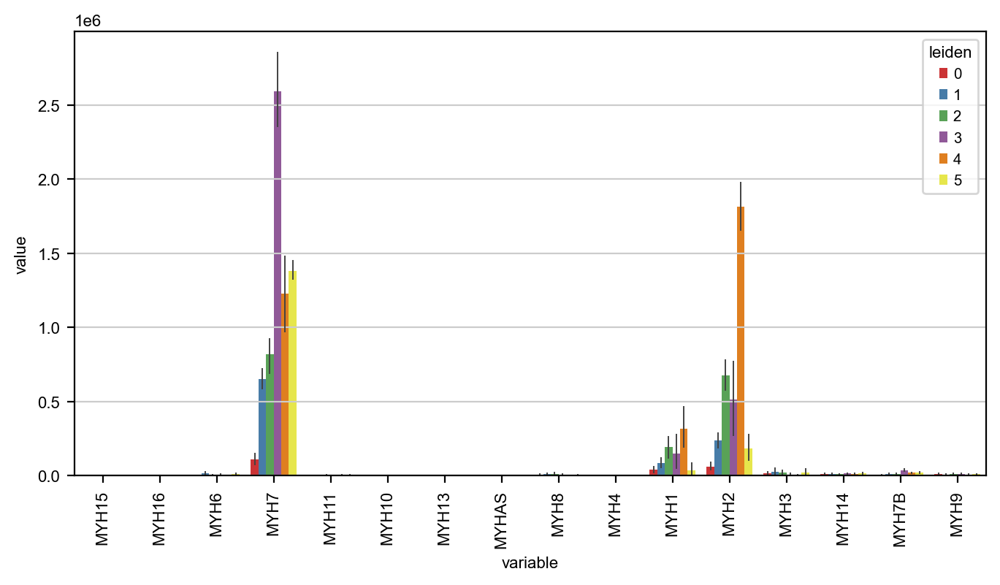

In [15]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

sns.barplot(data=df2, x="variable", y="value", hue="leiden", palette="Set1", errwidth=0.7)
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '7'),
  Text(2, 0, '8'),
  Text(3, 0, '9'),
  Text(4, 0, '13')])

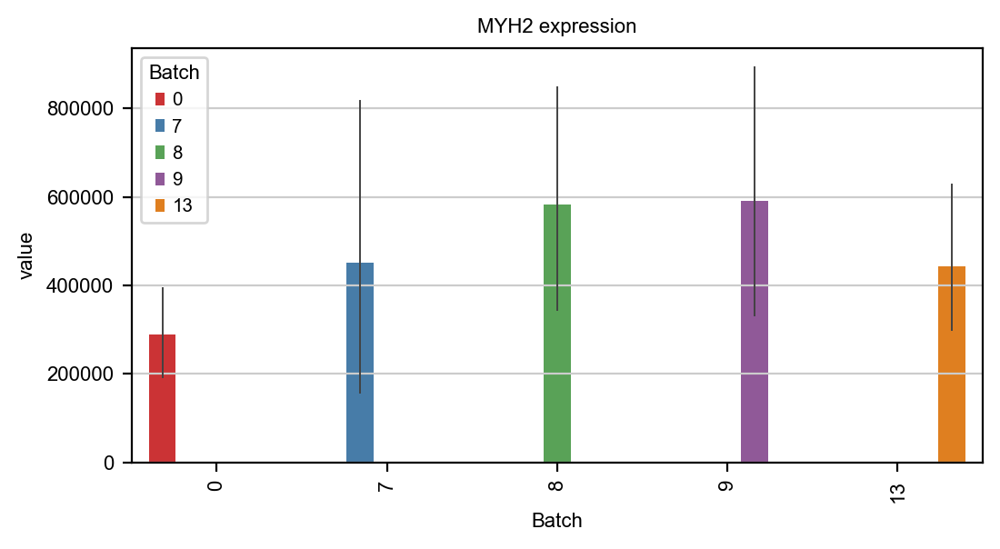

In [10]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [6, 3])

#sns.barplot(data=df2[(df2['variable'] == 'SRSF1') & (df2['Donor'] == 'patient_3') ], x="Minor_cluster", y="value", hue="Phenotype", errwidth=0.7)
sns.barplot(data=df2[(df2['variable'] == 'MYH2')], x="Batch", y="value", hue="Batch", palette="Set1", errwidth=0.7).set(title='MYH2 expression')

plt.xticks(rotation=90)
#plt.savefig('T_activation_score.pdf')

In [131]:
sc.pp.neighbors(adata_MYH, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_MYH)

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


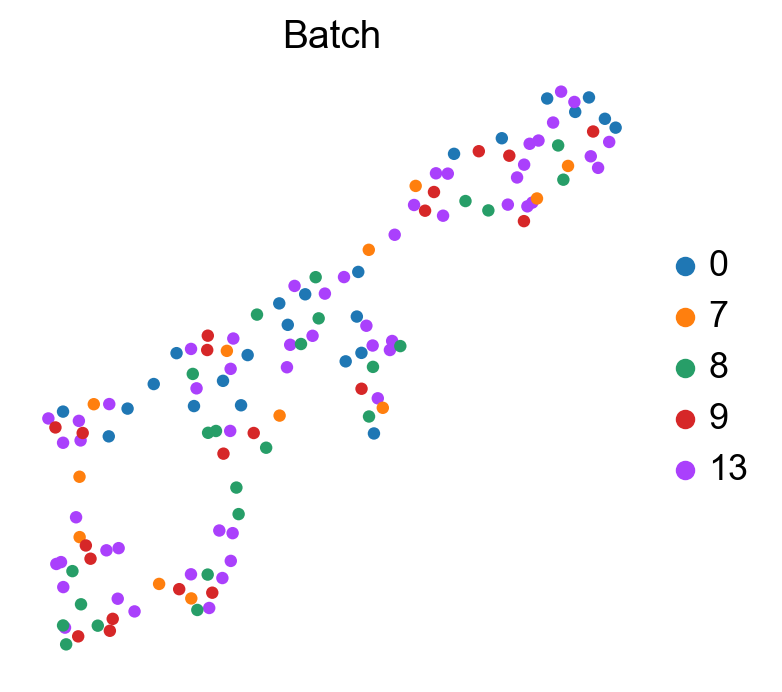

In [134]:
sc.pl.umap(adata_MYH, color=['Batch'], size=80)

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


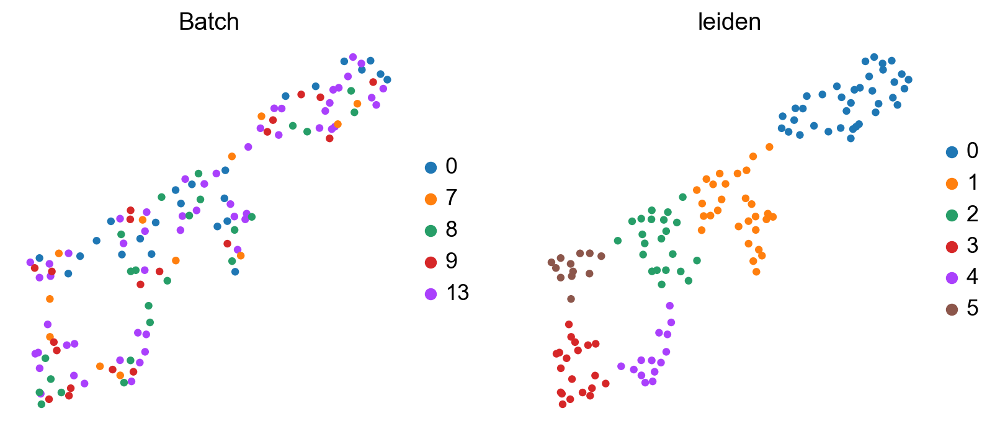

In [135]:
sc.tl.leiden(adata_MYH, resolution =0.5)
sc.pl.umap(adata_MYH, color=['Batch', 'leiden'], size=80)

In [137]:
adata_adj.obs = adata_MYH.obs
adata_adj.obs

,Batch,leiden
0_FM1812,0,5
0_FM22,0,2
0_FM2670,0,2
0_FM3310,0,2
0_FM3311,0,1
...,...,...
9_FM3814,9,0
9_FM3835,9,0
9_HL_VL_AMP08,9,2
9_JE_VL_AMP05,9,5


In [140]:
adata_MYH = sc.read('./write/adata_adj_MYH.h5ad')


adata_MYH

AnnData object with n_obs × n_vars = 134 × 61589
    obs: 'Batch', 'leiden'
    uns: 'Batch_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:418: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:417: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
c:\Users\Hua\miniconda3\envs\scanpy\lib\site-packages\scanpy\tools\_rank_genes_groups.py:417: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
c:\Users\Hua\miniconda3

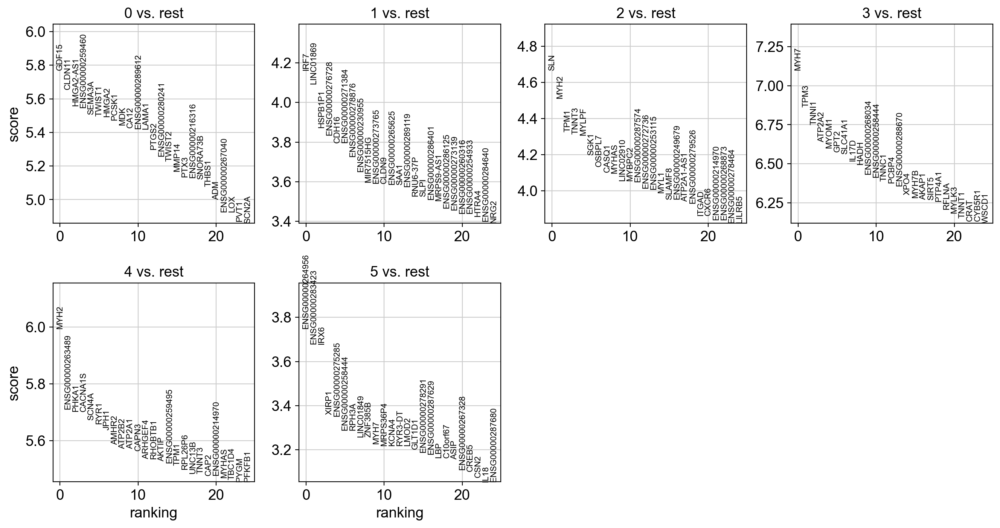

In [141]:
sc.tl.rank_genes_groups(adata_MYH, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_MYH, n_genes=25, sharey=False)

In [147]:
# MC gene set
Set_genes = sc.get.rank_genes_groups_df(adata_MYH, group='4')
Set_genes_up = Set_genes[(Set_genes.pvals_adj < 0.05) & (Set_genes.logfoldchanges > 2)].sort_values(by=['scores'], ascending=False).reset_index(drop=True)
Set_genes_down = Set_genes[(Set_genes.pvals_adj < 0.05) & (Set_genes.logfoldchanges < -2)].sort_values(by=['scores'], ascending=False).reset_index(drop=True)

glist_up = Set_genes_up['names'].squeeze().str.strip().tolist()
glist_down = Set_genes_down['names'].squeeze().str.strip().tolist()

print(f'Up: {len(glist_up)}, Down: {len(glist_down)}')

Up: 3137, Down: 505
